# CoronaVirus Predictions for different States in the USA

### General Overview

The aim of the following project is to develop a Machine Learning System that is able to predict the number of corona virus cases in different states in the United States of America. The end goal is to be able to predict, to a high degree of accuracy, the date as to when the coronavirus pandemic will end and life will resume as normal. This in turn has many economic and social benefits i.e. Entertainment companies can know when exactly it will be suitable to hold concerts; stock traders will have an idea as to when stocks that spiked due to the pandemic are most likely to start plateuing etc.

The system output will be the number of reported coronavirus cases, deaths and recoveries for a particular day. Based on these outputs we can plot a graph and determine the trends which will then allow us to determing when the coronavirus pandemic will be most likely to end.

### Machine Learning Model Description

Our Machine Learning Model will be:
1. **A supervised Model** - Our model will rely on previous data on the number of reported coronavirus cases, deaths and recoveries in order to predict the future number of cases of coronavirus cases deaths and recoveries.
2. **A regression Model** - Our model will be a typical regression task. However since we will be predicting multiple values our model can be referred to as an **multivariate regression** model. In addiiton since we will be relying on only one feature to predict the relevant feature i.e. number of previous reported coronavirus cases to predict future reported corona virus cases, our model can be said to be a **singular regression** model.
3. **A batch Learning Model** - Every single day, a new data point is added to our dataset. i.e. the newly reported coronavirus cases, deaths and recoveries. Our model would like to take this new datapoint into account while making future predicitons. Since our dataset is small enough to fit into memory, we can use batch learning to retrain our model daily and make new future predictions.


### Performance Measure

In this case, we would love to know how badly our system is performing. This refers to how for away our predictions are from the official daily reported coronavirus cases, deaths and recoveries. A good example of a **cost function** we can use in this case can be the **Root Mean Square Error (RMSE)**. 

The **RMSE** typically gives us an idea of how much error our ML system typically makes in it predicitons with a higer weight for large errors.




## Fetching Data and Preprocessing

Import all relevant packages

In [1]:
import requests
import pandas as pd
import numpy as np
import datetime
import csv

Define our dataset headers

In [2]:
COLUMNS = ['Date','Alabama','Alaska','American Samoa','Arizona','Arkansas', 'California', 'Colorado', 'Connecticut',
           'Delaware', 'Diamond Princess', 'District of Columbia', 'Florida', 'Georgia', 'Grand Princess', 'Guam',
           'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland',
           'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada',
           'New Hampshire', 'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota',
           'Northern Mariana Islands', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania', 'Puerto Rico', 'Rhode Island',
           'South Carolina', 'South Dakota', 'Tennessee', 'Texas', 'Utah', 'Vermont', 'Virgin Islands', 'Virginia',
           'Washington','West Virginia','Wisconsin','Wyoming']

#### Dataset definitions 

We will have 3 different datasets.

1. **covid_confirmed_dataset** - this contains the total number of daily reported covid cases for each state on a given day since 28th June 2020 to date.
2. **covid_deaths_dataset** - this contains the total number of daily reported covid deaths for each state on a given day since 28th June 2020 to date.
3. **covid_recovered_dataset** - this contains the total number of daily reported covid recoveries for each state on a given day since 28th June 2020 to date.

In [3]:
covid_confirmed_dataset = pd.DataFrame(columns=COLUMNS)
covid_deaths_dataset = pd.DataFrame(columns=COLUMNS)
covid_recovered_dataset = pd.DataFrame(columns=COLUMNS)



We are obtaining our data from https://www.github.com/CSSEGISandData/COVID-19/ which is a public github dataset that is updated daily with the latest number of coronavirus cases. We aim to make a http get request to the endpoint and obtain relevant daily coronavirus data and then append it to our dataset.

###### Here is a list of the required helper functions that will allow us to fetch and update our data successfully.

In [4]:
# Helper function to append data to the relevant dataset
def append_data_to_dataset(dataset, data_frame):
    temp_data = dict()
    temp_data['Date'] = date
    for data in data_frame:
        temp_data[data[0].strip()] = 0 if data[1] == '' else int(float(data[1]))
    dataset = dataset.append(temp_data, ignore_index=True)
    return dataset

In [5]:
# Helper function to get daily data from link and append it to the relevant dataset
def get_daily_data(date, covid_confirmed_dataset, covid_deaths_dataset, covid_recovered_dataset):
    url = "https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/"+date+".csv"
    response = requests.get(url, allow_redirects=True)
    content = response.content.decode('utf-8')
    data = list(csv.reader(content.splitlines(), delimiter=","))
    df = pd.DataFrame(data[1:], columns=data[0])
    df_confirmed = np.array(df.loc[:, ["Province_State", "Confirmed"]])
    df_deaths = np.array(df.loc[:, ["Province_State", "Deaths"]])
    df_recovered = np.array(df.loc[:, ["Province_State", "Recovered"]])
    covid_confirmed_dataset = append_data_to_dataset(covid_confirmed_dataset, df_confirmed)
    covid_deaths_dataset = append_data_to_dataset(covid_deaths_dataset, df_deaths)
    covid_recovered_dataset = append_data_to_dataset(covid_recovered_dataset, df_recovered)
    return covid_confirmed_dataset, covid_deaths_dataset, covid_recovered_dataset

In [6]:
# Helper function to parse the date into the required readable format
def parse_date(date):
    date_obj = datetime.datetime.strptime(date[:-3], '%Y-%m-%dT%H:%M:%S.%f')
    return "{:%m-%d-%Y}".format(date_obj)

##### Here is the driver code that is responsible for fetching and updating our data.

In [7]:
start_date = "06-28-2020"
dates = np.array(pd.date_range(start_date, pd.to_datetime('today')))
try:
    for date in dates:
        temp_date = parse_date(str(date))
        covid_confirmed_dataset, covid_deaths_dataset, covid_recovered_dataset = get_daily_data(
            temp_date, covid_confirmed_dataset, covid_deaths_dataset, covid_recovered_dataset)
except KeyError as e:
    pass

#### Here is a quick look of our data Structures

Our three datasets have a similar structure. The only difference is the metric being reported. One reports the number of daily reported coronavirus cases, where as another one reports the number of daily reported coronavirus deaths while the last one reports the number of daily reported coronavirus recoveries.

Here is a quick look of the data structures.

In [8]:
covid_confirmed_dataset

,Date,Alabama,Alaska,American Samoa,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,...,Tennessee,Texas,Utah,Vermont,Virgin Islands,Virginia,Washington,West Virginia,Wisconsin,Wyoming
0,2020-06-28,36503,880,0,73920,19818,222630,32307,46303,11226,...,40172,151045,21100,1202,81,61736,32267,2832,27743,1417
1,2020-06-29,37589,901,0,74545,20257,231578,32511,46362,11376,...,42297,157434,21664,1208,81,62189,32831,2870,28058,1450
2,2020-06-30,38477,937,0,79228,20777,239538,32715,46514,11474,...,43509,163737,22217,1208,81,62787,33439,2905,28659,1487
3,2020-07-01,39647,975,0,84105,21197,247317,33029,46572,11510,...,45315,172859,22716,1210,90,63203,34152,2979,29199,1514
4,2020-07-02,41340,1014,0,87445,22075,255494,33352,46646,11731,...,46890,180169,23270,1227,92,63735,34909,3053,29738,1550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
272,2021-03-27,514072,62161,0,839334,329860,3658714,457597,305210,93701,...,806792,2779464,384173,18623,2901,613974,361115,140316,633663,56046
273,2021-03-28,514391,62161,0,839888,329929,3660713,458554,305210,94062,...,806792,2782735,384562,18820,2907,615366,361115,140613,634133,56046
274,2021-03-29,514619,62161,0,840492,330008,3663913,459361,308439,94402,...,809692,2786219,384756,19002,2907,616509,362385,140991,634453,56190
275,2021-03-30,514980,62797,0,841078,330186,3666266,460318,310056,94573,...,810529,2789428,385127,19109,2907,617941,363235,141322,635314,56236


In [9]:
covid_confirmed_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 277 entries, 0 to 276
Data columns (total 59 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Date                      277 non-null    datetime64[ns]
 1   Alabama                   277 non-null    object        
 2   Alaska                    277 non-null    object        
 3   American Samoa            277 non-null    object        
 4   Arizona                   277 non-null    object        
 5   Arkansas                  277 non-null    object        
 6   California                277 non-null    object        
 7   Colorado                  277 non-null    object        
 8   Connecticut               277 non-null    object        
 9   Delaware                  277 non-null    object        
 10  Diamond Princess          277 non-null    object        
 11  District of Columbia      277 non-null    object        
 12  Florida               

In [10]:
covid_deaths_dataset

,Date,Alabama,Alaska,American Samoa,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,...,Tennessee,Texas,Utah,Vermont,Virgin Islands,Virginia,Washington,West Virginia,Wisconsin,Wyoming
0,2020-06-28,919,14,0,1594,264,5932,1676,4316,564,...,584,2534,167,56,6,1732,1292,93,777,20
1,2020-06-29,929,14,0,1598,265,5983,1681,4320,565,...,592,2564,168,56,6,1740,1297,93,777,20
2,2020-06-30,950,14,0,1645,270,6082,1690,4322,566,...,604,2593,172,56,6,1763,1303,93,784,20
3,2020-07-01,972,14,0,1725,277,6169,1697,4324,567,...,609,2649,173,56,6,1786,1309,93,786,20
4,2020-07-02,985,14,0,1764,279,6265,1701,4326,568,...,620,2694,176,56,6,1816,1319,93,793,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
272,2021-03-27,10526,313,0,16912,5590,58815,6089,7865,1544,...,11816,48039,2101,224,26,10178,5218,2631,7274,695
273,2021-03-28,10526,313,0,16918,5595,58949,6092,7865,1544,...,11816,48093,2114,225,26,10198,5218,2634,7274,695
274,2021-03-29,10526,313,0,16918,5601,59030,6092,7883,1552,...,11866,48134,2114,225,26,10219,5226,2638,7277,695
275,2021-03-30,10527,313,0,16941,5616,59128,6099,7885,1559,...,11894,48242,2118,225,26,10242,5237,2640,7292,695


In [11]:
covid_deaths_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 277 entries, 0 to 276
Data columns (total 59 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Date                      277 non-null    datetime64[ns]
 1   Alabama                   277 non-null    object        
 2   Alaska                    277 non-null    object        
 3   American Samoa            277 non-null    object        
 4   Arizona                   277 non-null    object        
 5   Arkansas                  277 non-null    object        
 6   California                277 non-null    object        
 7   Colorado                  277 non-null    object        
 8   Connecticut               277 non-null    object        
 9   Delaware                  277 non-null    object        
 10  Diamond Princess          277 non-null    object        
 11  District of Columbia      277 non-null    object        
 12  Florida               

In [12]:
covid_recovered_dataset

,Date,Alabama,Alaska,American Samoa,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,...,Tennessee,Texas,Utah,Vermont,Virgin Islands,Virginia,Washington,West Virginia,Wisconsin,Wyoming
0,2020-06-28,18866,521,0,8926,13270,0,4442,8053,6665,...,26159,79974,11931,946,71,8005,0,2062,21953,1057
1,2020-06-29,18866,525,0,9179,14066,0,4459,8053,6665,...,26962,81335,12205,949,71,8023,0,2196,22217,1070
2,2020-06-30,18866,526,0,9411,14531,0,4479,8053,6667,...,27599,84818,12398,953,73,8080,0,2272,22587,1097
3,2020-07-01,18866,528,0,9715,15163,0,4502,8053,6676,...,28283,87556,12707,961,73,8131,0,2284,23089,1119
4,2020-07-02,22082,535,0,10137,15698,0,4524,8210,6678,...,28938,90720,13076,960,75,8496,0,2380,23527,1139
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
272,2021-03-27,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
273,2021-03-28,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
274,2021-03-29,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
275,2021-03-30,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [13]:
covid_recovered_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 277 entries, 0 to 276
Data columns (total 59 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Date                      277 non-null    datetime64[ns]
 1   Alabama                   277 non-null    object        
 2   Alaska                    277 non-null    object        
 3   American Samoa            277 non-null    object        
 4   Arizona                   277 non-null    object        
 5   Arkansas                  277 non-null    object        
 6   California                277 non-null    object        
 7   Colorado                  277 non-null    object        
 8   Connecticut               277 non-null    object        
 9   Delaware                  277 non-null    object        
 10  Diamond Princess          277 non-null    object        
 11  District of Columbia      277 non-null    object        
 12  Florida               

#### Dataset Analysis

From our analysis, we can say that our datasets does not have any missing values as each column has a count equal to the number of rows.

However, we realize that our datasets have the dtype of object which insinuates a categorical object instead of a numerical object. We therefore have to convert these to integers

In [14]:
for i in range(1, len(COLUMNS)):
    covid_confirmed_dataset[COLUMNS[i]] = covid_confirmed_dataset[COLUMNS[i]].astype('float').astype('int')
    covid_deaths_dataset[COLUMNS[i]] = covid_deaths_dataset[COLUMNS[i]].astype('float').astype('int')    
    covid_recovered_dataset[COLUMNS[i]] = covid_recovered_dataset[COLUMNS[i]].astype('float').astype('int')   

In [15]:
covid_confirmed_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 277 entries, 0 to 276
Data columns (total 59 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Date                      277 non-null    datetime64[ns]
 1   Alabama                   277 non-null    int64         
 2   Alaska                    277 non-null    int64         
 3   American Samoa            277 non-null    int64         
 4   Arizona                   277 non-null    int64         
 5   Arkansas                  277 non-null    int64         
 6   California                277 non-null    int64         
 7   Colorado                  277 non-null    int64         
 8   Connecticut               277 non-null    int64         
 9   Delaware                  277 non-null    int64         
 10  Diamond Princess          277 non-null    int64         
 11  District of Columbia      277 non-null    int64         
 12  Florida               

We could also have used **sklearn's default prepocessing label enoder** to transform our data from object data type into into int64 data type. See the code snippet below. 

In [16]:
from sklearn import preprocessing

def convert(dataset):
    number = preprocessing.LabelEncoder()
    # we would need to perform a for loop here in order to loop through every column_name which 
    # in our case is every state
    dataset['column_name'] = number.fit_transform(dataset['column_name'])
    data=data.fillna(0) # fill holes with default value
    return dataset


Now, we have our datasets in the desired format. There are no missing values and therefore we can therefore go on ahead with describing our data.

### United States COVID Dataset descriptions

In [17]:
from IPython.display import display_html 

covid_confirmed_dataset["Sum"] = covid_confirmed_dataset[COLUMNS[1:]].sum(axis=1)
covid_deaths_dataset["Sum"] = covid_deaths_dataset[COLUMNS[1:]].sum(axis=1)
covid_recovered_dataset["Sum"] = covid_recovered_dataset[COLUMNS[1:]].sum(axis=1)


confirmed_styler = covid_confirmed_dataset.loc[:,["Date", "Sum"]].describe().style.set_table_attributes("style='display:inline'").set_caption('covid_confirmed_dataset')
deaths_styler = covid_deaths_dataset.loc[:,["Date", "Sum"]].describe().style.set_table_attributes("style='display:inline'").set_caption('covid_deaths_dataset')
recovered_styler = covid_recovered_dataset.loc[:,["Date", "Sum"]].describe().style.set_table_attributes("style='display:inline'").set_caption('covid_recovered_dataset')

display_html(confirmed_styler._repr_html_()+deaths_styler._repr_html_()+recovered_styler._repr_html_(), raw=True)

,Sum
count,277.000000
mean,14540939.971119
std,9524351.957153
min,2560046.000000
25%,6258809.000000
50%,10840290.000000
75%,24711094.000000
max,30460730.000000
,Sum
count,277.000000


### United States COVID Dataset descriptions broken down per state

In [18]:
%matplotlib inline
import matplotlib.pyplot as plt

In [19]:
covid_confirmed_dataset.loc[:,COLUMNS].describe()

,Alabama,Alaska,American Samoa,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,Diamond Princess,...,Tennessee,Texas,Utah,Vermont,Virgin Islands,Virginia,Washington,West Virginia,Wisconsin,Wyoming
count,277.000000,277.000000,277.0,277.000000,277.000000,2.770000e+02,277.000000,277.000000,277.000000,277.0,...,277.000000,2.770000e+02,277.000000,277.000000,277.000000,277.000000,277.000000,277.000000,277.000000,277.000000
mean,264047.772563,28136.046931,0.0,411163.425993,162304.000000,1.691900e+06,211037.129964,137007.252708,42763.205776,49.0,...,396153.949458,1.362042e+06,184028.938628,6131.184116,1573.205776,279559.202166,176251.404332,56456.783394,325110.028881,26154.628159
std,158475.193440,22868.036162,0.0,260780.585463,108074.631634,1.223391e+06,158434.617941,94292.669711,28721.915049,0.0,...,267094.290194,8.513818e+05,132969.706222,5653.705972,802.163337,186070.734567,112552.284397,50500.042687,231825.218689,21682.076156
min,36503.000000,880.000000,0.0,73920.000000,19818.000000,2.226300e+05,32307.000000,46303.000000,11226.000000,49.0,...,40172.000000,1.510450e+05,21100.000000,1202.000000,81.000000,61736.000000,32267.000000,2832.000000,27743.000000,1417.000000
25%,130914.000000,5677.000000,0.0,205517.000000,64690.000000,7.374500e+05,58986.000000,53365.000000,17892.000000,49.0,...,162362.000000,6.594110e+05,54272.000000,1647.000000,1167.000000,125727.000000,77979.000000,11293.000000,80300.000000,3990.000000
50%,213617.000000,22405.000000,0.0,269577.000000,130318.000000,1.021804e+06,154038.000000,88645.000000,28016.000000,49.0,...,300458.000000,1.096469e+06,145789.000000,2743.000000,1426.000000,199262.000000,131141.000000,31639.000000,318023.000000,21341.000000
75%,432536.000000,52605.000000,0.0,699942.000000,279220.000000,3.122705e+06,381210.000000,235796.000000,72523.000000,49.0,...,697783.000000,2.208871e+06,330469.000000,10580.000000,2305.000000,459604.000000,296087.000000,112617.000000,575688.000000,50424.000000
max,515388.000000,62797.000000,0.0,841811.000000,330398.000000,3.668745e+06,462081.000000,310624.000000,94802.000000,49.0,...,811842.000000,2.791910e+06,385641.000000,19275.000000,2907.000000,618976.000000,364486.000000,141738.000000,636041.000000,56310.000000


United States confirmed COVID cases histograms broken down per state


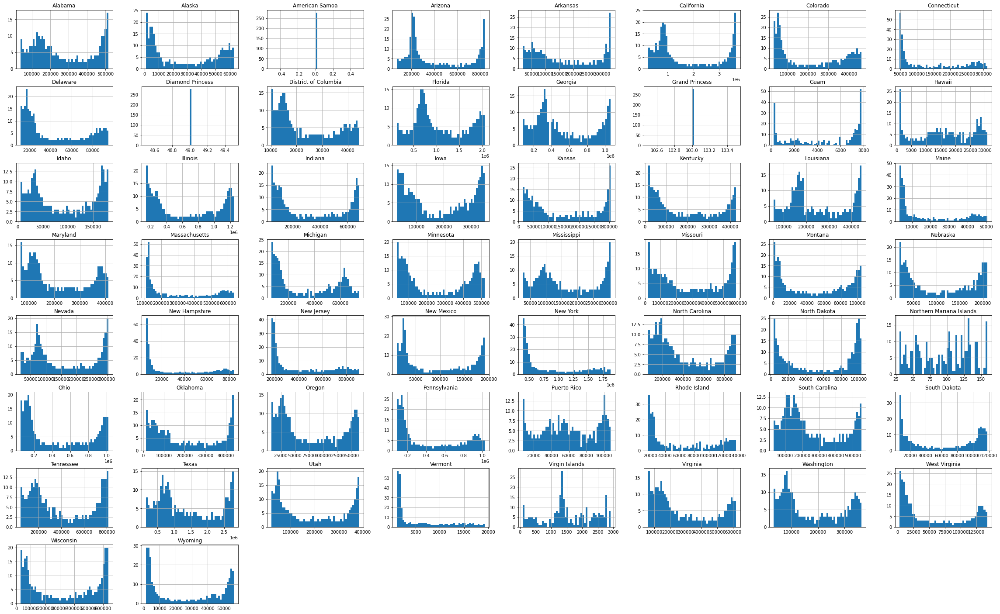

In [20]:
covid_confirmed_dataset.loc[:,COLUMNS].hist(bins=50, figsize=(40, 25))
print("United States confirmed COVID cases histograms broken down per state")
plt.show()

In [21]:
covid_deaths_dataset.loc[:,COLUMNS].describe()

,Alabama,Alaska,American Samoa,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,Diamond Princess,...,Tennessee,Texas,Utah,Vermont,Virgin Islands,Virginia,Washington,West Virginia,Wisconsin,Wyoming
count,277.000000,277.000000,277.0,277.000000,277.000000,277.000000,277.000000,277.000000,277.000000,277.0,...,277.000000,277.000000,277.000000,277.000000,277.000000,277.000000,277.000000,277.000000,277.000000,277.000000
mean,4507.743682,137.382671,0.0,8165.187726,2617.176895,24879.155235,3477.238267,5520.407942,912.342960,0.0,...,5204.563177,23277.079422,951.115523,105.519856,19.223827,4599.342960,2936.963899,980.577617,3475.310469,273.537906
std,3077.663714,107.603800,0.0,4600.262109,1854.431614,16015.843073,1706.717222,1288.703956,331.799258,0.0,...,3873.294295,13427.978857,632.235155,61.403251,6.578986,2446.710593,1253.546429,871.135665,2446.404214,262.090584
min,919.000000,14.000000,0.0,1594.000000,264.000000,5932.000000,1676.000000,4316.000000,564.000000,0.0,...,584.000000,2534.000000,167.000000,56.000000,6.000000,1732.000000,1292.000000,93.000000,777.000000,20.000000
25%,2275.000000,42.000000,0.0,5207.000000,882.000000,13709.000000,1971.000000,4468.000000,623.000000,0.0,...,1862.000000,13873.000000,420.000000,58.000000,16.000000,2677.000000,1942.000000,246.000000,1168.000000,42.000000
50%,3231.000000,97.000000,0.0,6257.000000,2148.000000,18218.000000,2504.000000,4737.000000,765.000000,0.0,...,3852.000000,20153.000000,701.000000,59.000000,23.000000,3785.000000,2477.000000,565.000000,2683.000000,127.000000
75%,6379.000000,254.000000,0.0,11772.000000,4496.000000,35796.000000,5440.000000,6774.000000,1241.000000,0.0,...,8684.000000,33942.000000,1547.000000,168.000000,24.000000,5940.000000,4065.000000,1849.000000,6090.000000,550.000000
max,10554.000000,313.000000,0.0,16967.000000,5626.000000,59274.000000,6107.000000,7889.000000,1559.000000,0.0,...,11904.000000,48252.000000,2122.000000,227.000000,26.000000,10252.000000,5247.000000,2676.000000,7315.000000,700.000000


United States confirmed COVID deaths histograms broken down per state


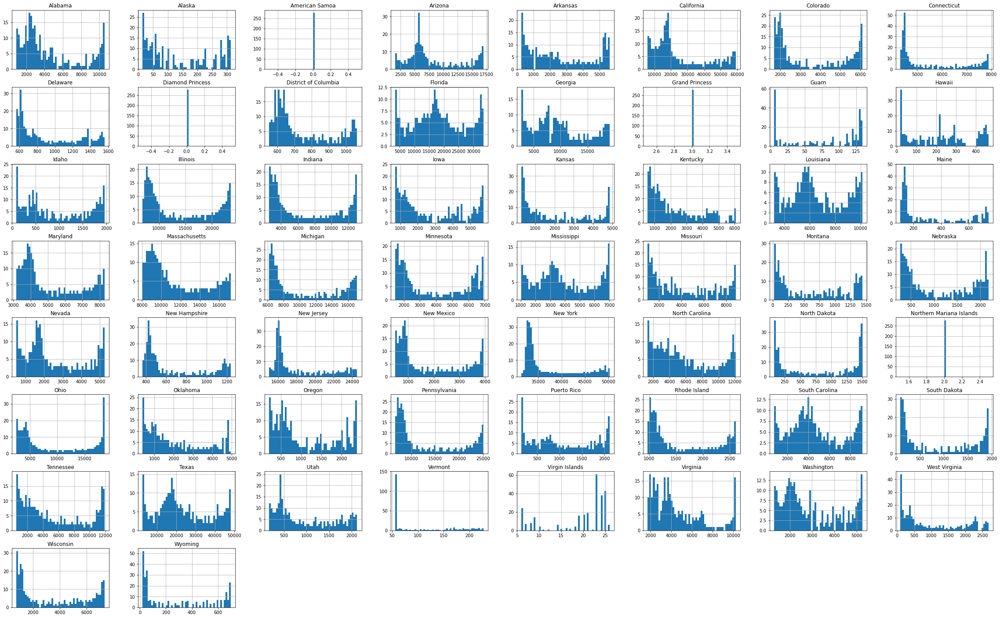

In [22]:
covid_deaths_dataset.loc[:,COLUMNS].hist(bins=50, figsize=(40, 25))
print("United States confirmed COVID deaths histograms broken down per state")
plt.show()

In [23]:
covid_recovered_dataset.loc[:,COLUMNS].describe()

,Alabama,Alaska,American Samoa,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,Diamond Princess,...,Tennessee,Texas,Utah,Vermont,Virgin Islands,Virginia,Washington,West Virginia,Wisconsin,Wyoming
count,277.000000,277.000000,277.0,277.000000,277.000000,277.0,277.000000,277.000000,277.000000,277.0,...,277.000000,2.770000e+02,277.000000,277.000000,277.000000,277.000000,277.0,277.000000,277.000000,277.000000
mean,111625.054152,3331.223827,0.0,43855.516245,119737.220217,0.0,9446.848375,8077.386282,9386.534296,0.0,...,288665.364621,9.016391e+05,122323.718412,3377.689531,1217.133574,19396.599278,0.0,34258.039711,224676.303249,18838.086643
std,90620.592073,3074.558966,0.0,32540.685062,97232.742602,0.0,6836.633985,3266.303027,6621.837792,0.0,...,244161.719169,7.060568e+05,113869.906612,3438.298585,793.480496,12150.582657,0.0,38597.610649,197877.322382,20086.833966
min,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
25%,37923.000000,0.000000,0.0,22358.000000,42998.000000,0.0,5277.000000,8516.000000,0.000000,0.0,...,85313.000000,3.583120e+05,34764.000000,1295.000000,439.000000,11728.000000,0.0,5863.000000,51456.000000,2541.000000
50%,74238.000000,2295.000000,0.0,36336.000000,89217.000000,0.0,6696.000000,9408.000000,9582.000000,0.0,...,205832.000000,7.297620e+05,71035.000000,1696.000000,1296.000000,18189.000000,0.0,14799.000000,136910.000000,6796.000000
75%,193149.000000,7161.000000,0.0,62839.000000,189915.000000,0.0,15696.000000,9800.000000,14487.000000,0.0,...,480227.000000,1.346963e+06,214048.000000,4667.000000,1824.000000,26929.000000,0.0,55019.000000,436233.000000,41346.000000
max,295690.000000,7165.000000,0.0,114855.000000,314732.000000,0.0,22364.000000,9800.000000,18851.000000,0.0,...,755474.000000,2.470308e+06,357312.000000,13145.000000,2559.000000,45892.000000,0.0,124502.000000,552311.000000,53550.000000


United States confirmed recovered COVID cases histograms broken down per state


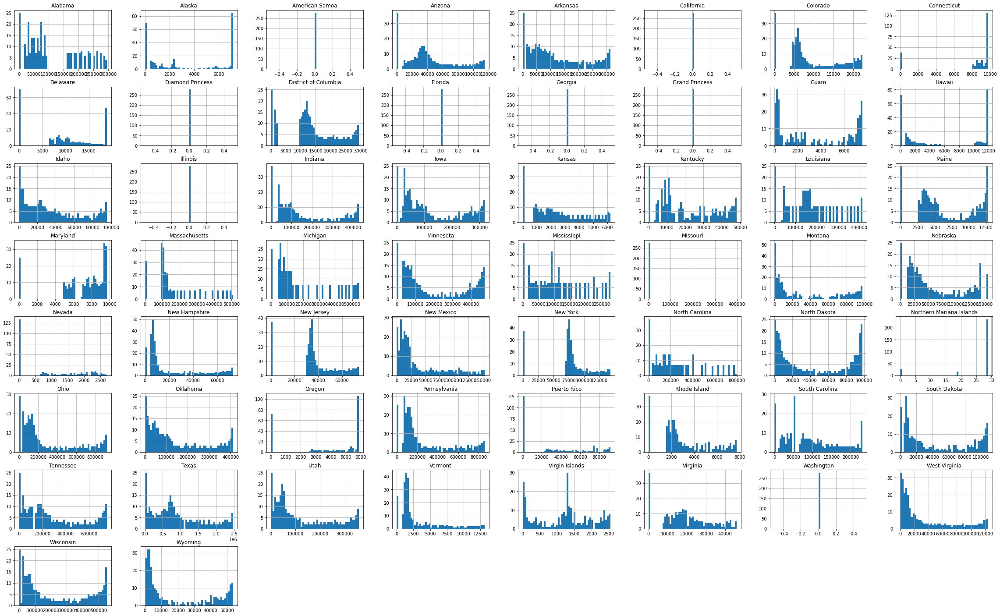

In [24]:
covid_recovered_dataset.loc[:,COLUMNS].hist(bins=50, figsize=(40, 25))
print("United States confirmed recovered COVID cases histograms broken down per state")
plt.show()

#### Histogram Analysis

So far, there have been confirmed reported corona virus cases in all states in the United States. However looking at the histogram analysis, some states claim to have no corona virus cases. This is definitely an error on our dataset and therefore states that claim to have no confirmed corona virus cases ought to be removed to preserve the integrity of our datasets.
These states include: **American Samoa.**

In addition, there have also been confirmed recoveries in all states in the United States. We therefore also ought to remove states that have no confirmed recoveries based on our histogram analysis to preserve the integrity of our datasets.
These states include: **Carlifornia, Diamond Princess, Florida, Georgia, Grand Princess, Illionis, Missouri & Washington.**


After removal of these states, our datasets remain only with the following states:

In [25]:
COLUMNS_NEW = [column for column in COLUMNS]
deleted_states = ['American Samoa', 'California', 'Diamond Princess', 'Florida', 'Georgia', 'Grand Princess', 'Illinois', 'Missouri', 'Washington']
for state in deleted_states:
    COLUMNS_NEW.remove(state)
print(COLUMNS_NEW[1:])

['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'Colorado', 'Connecticut', 'Delaware', 'District of Columbia', 'Guam', 'Hawaii', 'Idaho', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire', 'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota', 'Northern Mariana Islands', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania', 'Puerto Rico', 'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 'Texas', 'Utah', 'Vermont', 'Virgin Islands', 'Virginia', 'West Virginia', 'Wisconsin', 'Wyoming']


In addition we also notice that some of these histograms are tail heavy and this may make it difficult for some ML algorithms to detect patterns and for future reference we may consider transforming these attributes later on to have more bell-shaped distribution.


### Final Datasets

In [26]:
covid_confirmed_dataset = covid_confirmed_dataset.loc[:, COLUMNS_NEW]
covid_deaths_dataset = covid_deaths_dataset.loc[:, COLUMNS_NEW]
covid_recovered_dataset = covid_recovered_dataset.loc[:, COLUMNS_NEW]

In [27]:
covid_confirmed_dataset["Sum"] = covid_confirmed_dataset[COLUMNS_NEW[1:]].sum(axis=1)
covid_deaths_dataset["Sum"] = covid_deaths_dataset[COLUMNS_NEW[1:]].sum(axis=1)
covid_recovered_dataset["Sum"] = covid_recovered_dataset[COLUMNS_NEW[1:]].sum(axis=1)

## Data Visualization

All our visualization techniques will be applied to the entire united States before being applied personally to each State.

### The Latest Status of the Corona Virus Pandemic in the United States

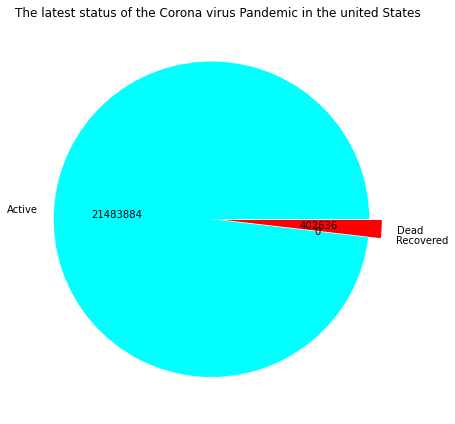

In [28]:
labels = ["Active", "Recovered", "Dead"]
total_confirmed = np.array(covid_confirmed_dataset["Sum"])[-1]
total_deaths = np.array(covid_deaths_dataset["Sum"])[-1]
total_recovered = np.array(covid_recovered_dataset["Sum"])[-1]
sizes= [total_confirmed-total_recovered, total_recovered, total_deaths]

def absolute_value(val):
    a  = np.round(val/100.*sum(sizes), 0)
    return int(a)

plt.figure(figsize=(10,6))
plt.pie(sizes, labels=labels, autopct=absolute_value, startangle=0, explode= [0.04, 0.04, 0.04], 
        colors=['cyan', 'lightgreen', 'red'])
fig = plt.gcf()
plt.title('The latest status of the Corona virus Pandemic in the united States')
plt.tight_layout()

### The Latest Status of the Corona Virus Pandemic in the United States broken down per State

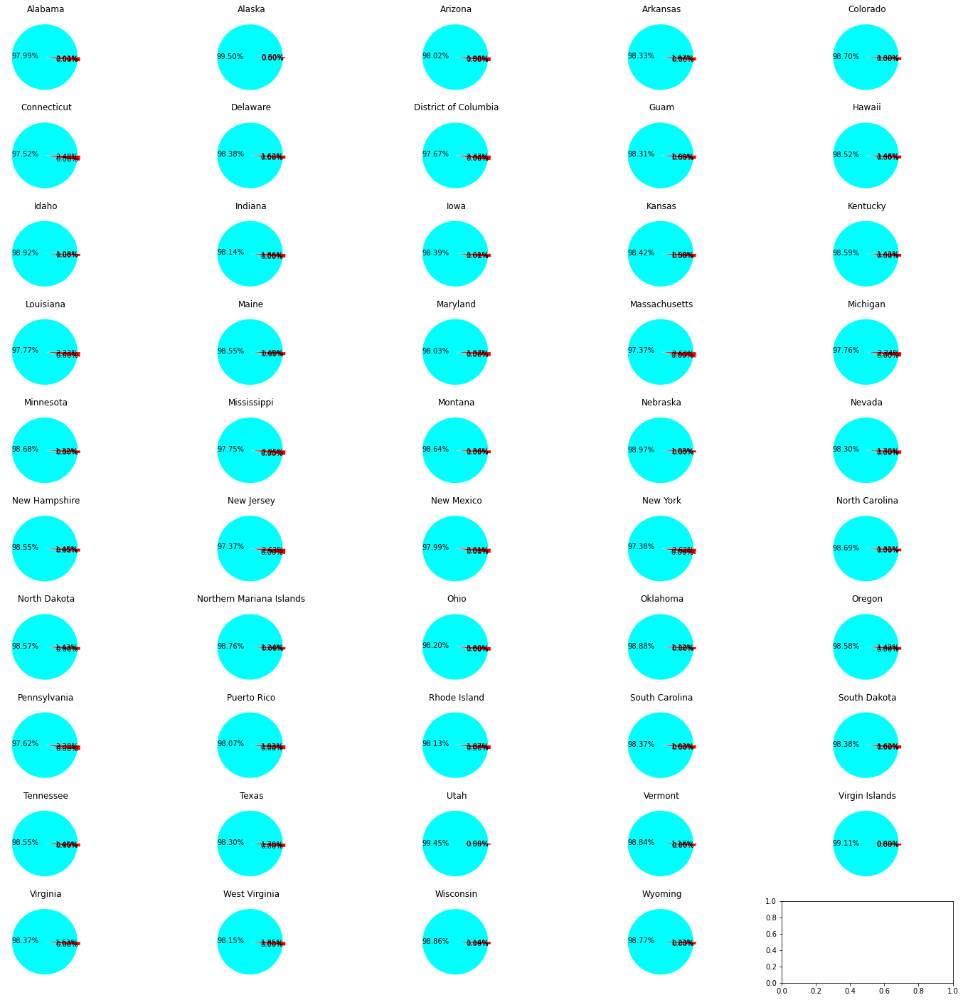

In [29]:
fig,axis = plt.subplots(nrows=10,ncols=5,figsize=(25, 25))
axes = axis.flatten()
for i in range(0, len(COLUMNS_NEW[1:])):
    labels = ["Active", "Recovered", "Dead"]
    total_confirmed = np.array(covid_confirmed_dataset[COLUMNS_NEW[1:][i]])[-1]
    total_deaths = np.array(covid_deaths_dataset[COLUMNS_NEW[1:][i]])[-1]
    total_recovered = np.array(covid_recovered_dataset[COLUMNS_NEW[1:][i]])[-1]
    sizes= [total_confirmed-total_recovered, total_recovered, total_deaths]

    axes[i].pie(sizes, autopct='%1.2f%%', startangle=0, explode= [0.04, 0.04, 0.04], 
            colors=['cyan', 'lightgreen', 'red'])
    axes[i].set_title(COLUMNS_NEW[1:][i])
plt.show()

### Corona Virus Trends in the US

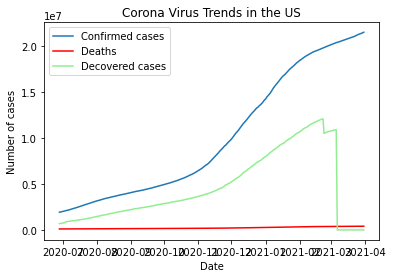

In [30]:
plt.plot(covid_confirmed_dataset["Date"], covid_confirmed_dataset["Sum"], label='Confirmed cases')
plt.plot(covid_deaths_dataset["Date"], covid_deaths_dataset["Sum"], c='red', label='Deaths')
plt.plot(covid_recovered_dataset["Date"], covid_recovered_dataset["Sum"], c='lightgreen', label='Decovered cases')
plt.title('Corona Virus Trends in the US')
plt.ylabel('Number of cases')
plt.xlabel('Date')
plt.legend()
plt.show()

### Corona Virus Trends in the US broken down per State

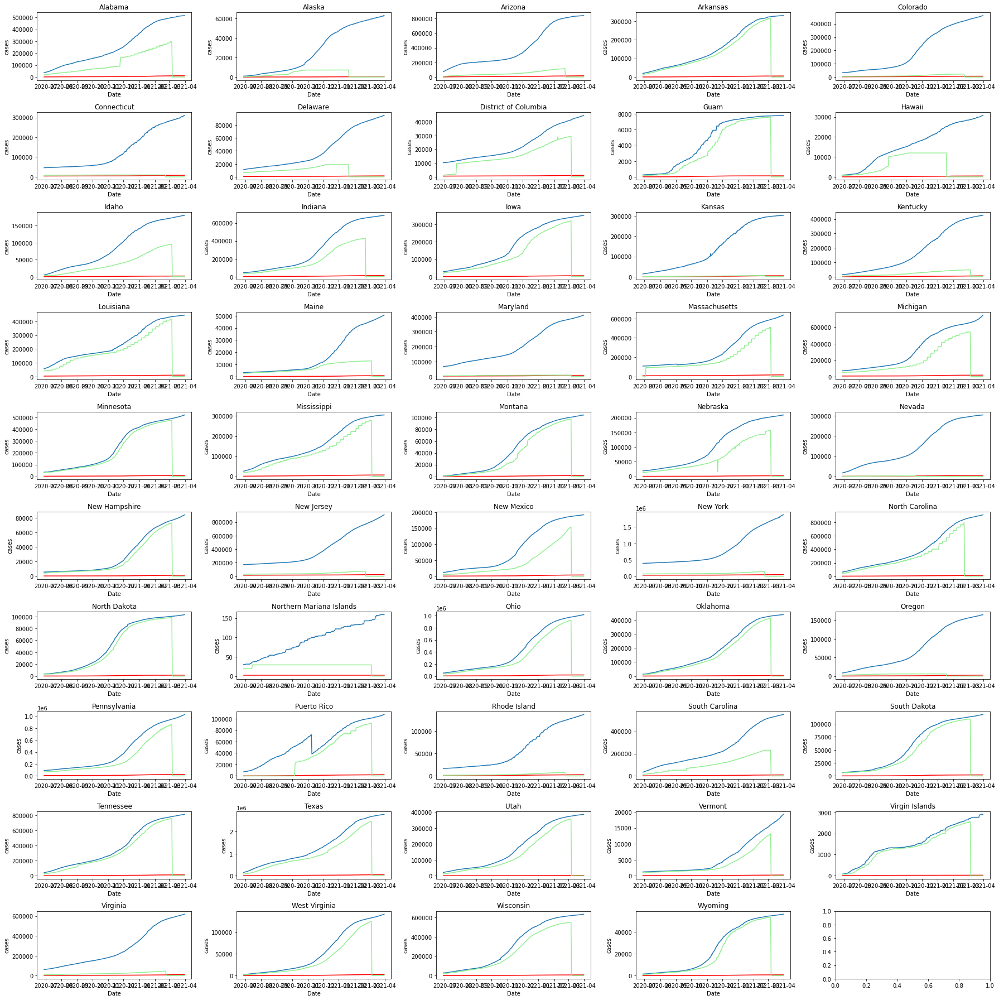

In [31]:
fig,axis = plt.subplots(nrows=10,ncols=5,figsize=(25, 25))
axes = axis.flatten()
for i in range(0, len(COLUMNS_NEW[1:])):
    axes[i].plot(covid_confirmed_dataset["Date"], covid_confirmed_dataset[COLUMNS_NEW[1:][i]], label='Confirmed cases')
    axes[i].plot(covid_deaths_dataset["Date"], covid_deaths_dataset[COLUMNS_NEW[1:][i]], c='red', label='Deaths')
    axes[i].plot(covid_recovered_dataset["Date"], covid_recovered_dataset[COLUMNS_NEW[1:][i]], c='lightgreen', label='Recovered cases')
    axes[i].set_title(COLUMNS_NEW[1:][i])
    axes[i].set_ylabel('cases')
    axes[i].set_xlabel('Date')
plt.tight_layout()

### Scatter Matrix Plots

In [32]:
from pandas.plotting import scatter_matrix

attributes = COLUMNS_NEW[1:]

Covid confirmed cases scatter matrix


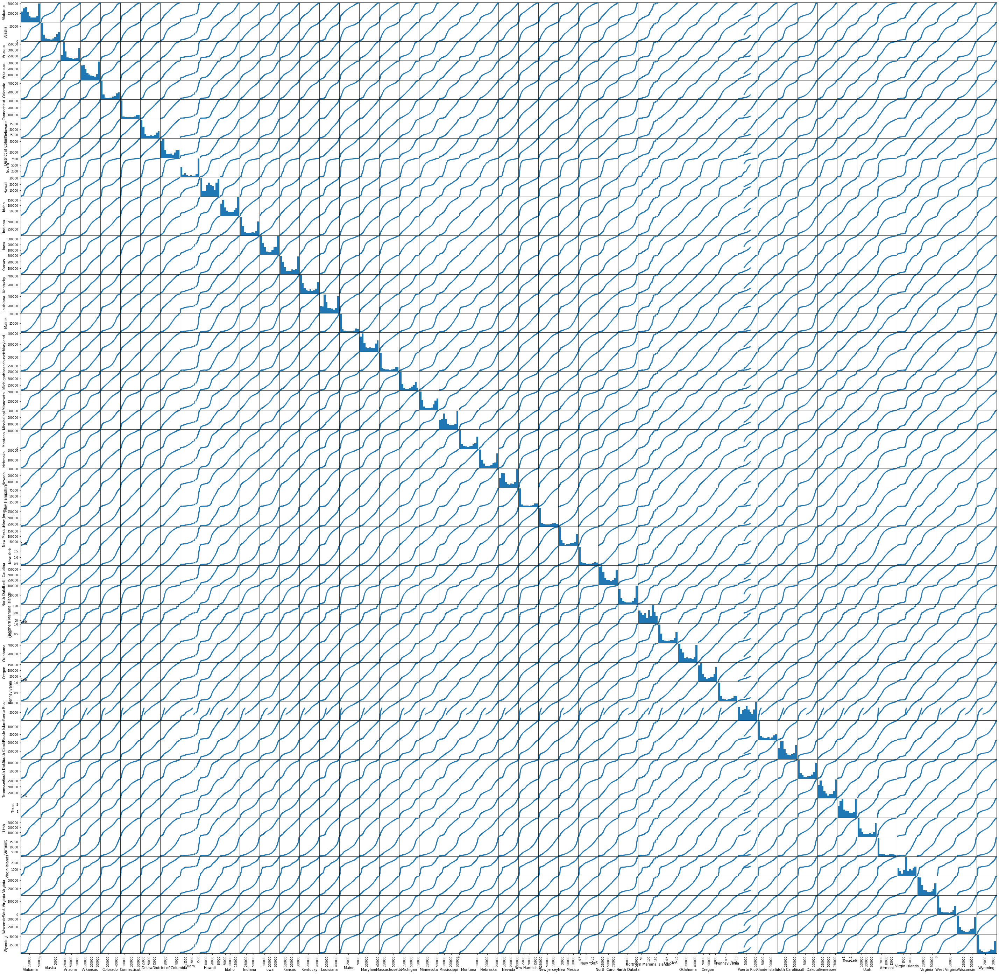

In [33]:
scatter_matrix(covid_confirmed_dataset[attributes], figsize=(50, 50))
print("Covid confirmed cases scatter matrix")
plt.show()

/opt/anaconda3/lib/python3.8/site-packages/pandas/plotting/_matplotlib/misc.py:80: UserWarning: Attempting to set identical left == right == 2.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[j])
/opt/anaconda3/lib/python3.8/site-packages/pandas/plotting/_matplotlib/misc.py:81: UserWarning: Attempting to set identical bottom == top == 2.0 results in singular transformations; automatically expanding.
  ax.set_ylim(boundaries_list[i])
/opt/anaconda3/lib/python3.8/site-packages/pandas/plotting/_matplotlib/misc.py:71: UserWarning: Attempting to set identical left == right == 2.0 results in singular transformations; automatically expanding.
  ax.set_xlim(boundaries_list[i])


Covid deaths scatter matrix


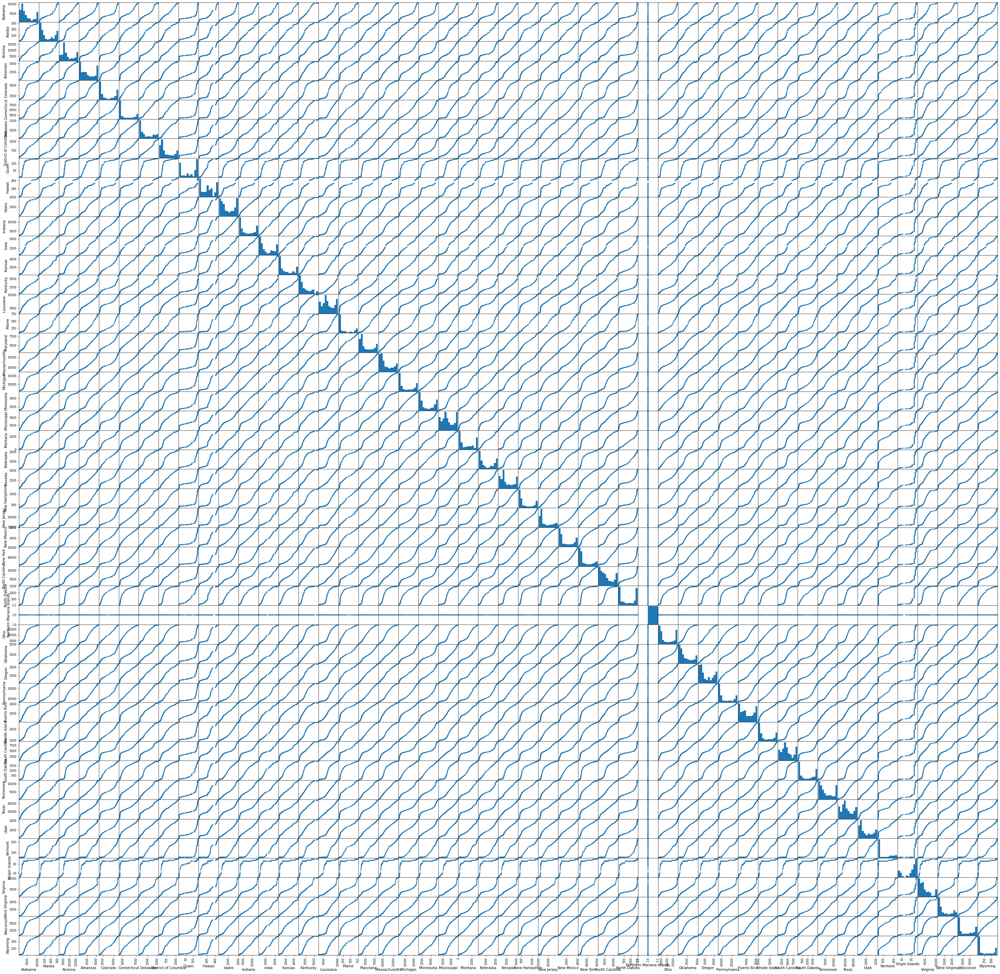

In [34]:
scatter_matrix(covid_deaths_dataset[attributes], figsize=(50, 50))
print("Covid deaths scatter matrix")
plt.show()

Covid recovered cases scatter matrix


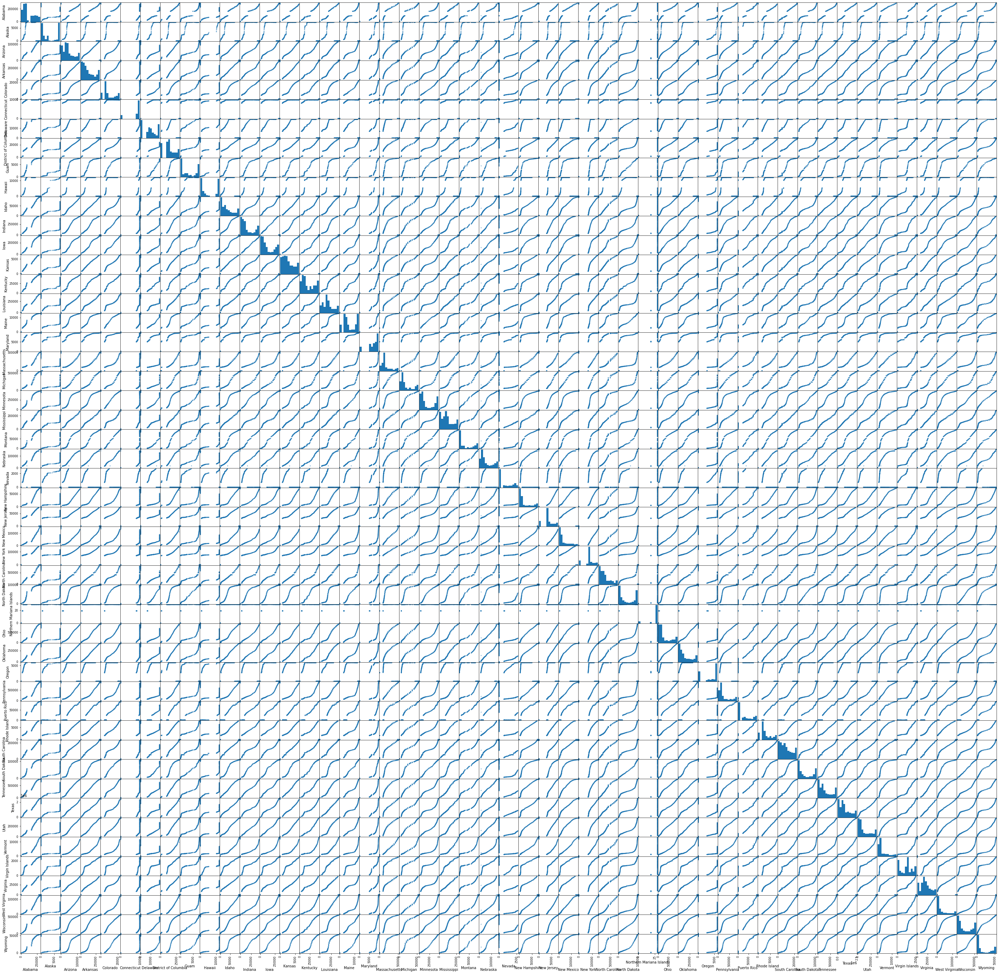

In [35]:
scatter_matrix(covid_recovered_dataset[attributes], figsize=(50, 50))
print("Covid recovered cases scatter matrix")
plt.show()

From the Scatter plot matrixes, we are able to observe some peculiarities about our datasets with regards to Northern Mariana Islands.

## Training and Test Set Creation

We would like to split our data into test sets and training sets. In addition, we would love to ensure that whenever new datapoints are added to our data, the testing set remains consistent and no datapoint that was in the training set will ever belong to the testing set. 

In order to achieve this, we can use a random number generator's seed before permutating our data so that only similar indices are always returned. See the implementation below.

In [36]:
from sklearn.model_selection import train_test_split
from zlib import crc32

def test_set_check(id_column, ratio):
    return crc32(np.int64(id_column)) & 0xffffffff < ratio * 2**32

def split_dataset_by_id(dataset, ratio, id_column):
    ids = dataset[id_column]
    in_test_set = ids.apply(lambda id_: test_set_check(id_, ratio))
    return dataset.loc[~in_test_set], dataset.loc[in_test_set]

covid_confirmed_dataset_with_id = covid_confirmed_dataset.reset_index()
covid_deaths_dataset_with_id = covid_deaths_dataset.reset_index()
covid_recovered_dataset_with_id = covid_recovered_dataset.reset_index()

train_set_confirmed, test_set_confirmed = split_dataset_by_id(covid_confirmed_dataset_with_id, 0.2, "index")
train_set_deaths, test_set_deaths = split_dataset_by_id(covid_deaths_dataset_with_id, 0.2, "index")
train_set_recovered, test_set_recovered = split_dataset_by_id(covid_recovered_dataset_with_id, 0.2, "index")

Here are sample descriptions of our training and testing datasets.

In [37]:
train_set_confirmed.describe()

,index,Alabama,Alaska,Arizona,Arkansas,Colorado,Connecticut,Delaware,District of Columbia,Guam,...,Tennessee,Texas,Utah,Vermont,Virgin Islands,Virginia,West Virginia,Wisconsin,Wyoming,Sum
count,220.000000,220.000000,220.000000,220.000000,220.000000,220.000000,220.000000,220.000000,220.000000,220.000000,...,220.000000,2.200000e+02,220.000000,220.000000,220.000000,220.000000,220.000000,220.00000,220.000000,2.200000e+02
mean,138.768182,265680.072727,28341.400000,413673.822727,163398.086364,212354.981818,137794.513636,43020.136364,23686.950000,4671.863636,...,398817.645455,1.370390e+06,185258.845455,6163.940909,1582.754545,281313.663636,56921.327273,327332.75000,26338.895455,1.021837e+07
std,79.791772,158466.907035,22855.044314,261258.691478,108100.928356,158469.993491,94312.396246,28727.283775,11184.949376,2975.162701,...,267158.764006,8.512181e+05,133000.478502,5641.064245,798.089216,186092.825178,50548.496764,231695.26371,21689.905158,6.721366e+06
min,0.000000,36503.000000,880.000000,73920.000000,19818.000000,32307.000000,46303.000000,11226.000000,10248.000000,247.000000,...,40172.000000,1.510450e+05,21100.000000,1202.000000,81.000000,61736.000000,2832.000000,27743.00000,1417.000000,1.923955e+06
25%,70.750000,132088.250000,5784.750000,205914.750000,65639.500000,59430.750000,53365.000000,18197.500000,14306.000000,1619.000000,...,164863.250000,6.625612e+05,54939.750000,1650.250000,1187.750000,127409.750000,11535.750000,81618.25000,4032.000000,4.206494e+06
50%,138.500000,214730.000000,22779.000000,271315.000000,131242.000000,156636.000000,88645.000000,28205.500000,18740.000000,5924.000000,...,302789.000000,1.101962e+06,148465.000000,2793.000000,1430.000000,200030.500000,32215.500000,320813.50000,21611.000000,7.664488e+06
75%,208.250000,436925.750000,52963.250000,709870.000000,281785.250000,383497.500000,237815.000000,73403.500000,34948.000000,7547.000000,...,702854.250000,2.231460e+06,333560.750000,10796.250000,2326.000000,464977.000000,113899.250000,578494.00000,50583.000000,1.739763e+07
max,276.000000,515388.000000,62797.000000,841811.000000,330398.000000,462081.000000,310624.000000,94802.000000,44513.000000,7807.000000,...,811842.000000,2.791910e+06,385641.000000,19275.000000,2907.000000,618976.000000,141738.000000,636041.00000,56310.000000,2.148388e+07


In [38]:
test_set_confirmed.describe()

,index,Alabama,Alaska,Arizona,Arkansas,Colorado,Connecticut,Delaware,District of Columbia,Guam,...,Tennessee,Texas,Utah,Vermont,Virgin Islands,Virginia,West Virginia,Wisconsin,Wyoming,Sum
count,57.000000,57.000000,57.00000,57.000000,57.000000,57.000000,57.000000,57.00000,57.000000,57.000000,...,57.000000,5.700000e+01,57.000000,57.000000,57.000000,57.000000,57.000000,57.000000,57.000000,5.700000e+01
mean,135.035088,257747.666667,27343.45614,401474.175439,158081.210526,205950.684211,133968.701754,41771.54386,23212.491228,4513.245614,...,385873.017544,1.329820e+06,179281.929825,6004.754386,1536.350877,272787.596491,54663.807018,316531.105263,25443.421053,9.917584e+06
std,81.961874,159756.882393,23104.18586,261006.750666,108828.376049,159601.914709,94992.078191,28934.63592,11316.149176,3052.440980,...,268966.748554,8.588097e+05,133924.558968,5750.920930,823.839866,187482.416671,50720.083928,234187.691570,21829.593016,6.771570e+06
min,2.000000,38477.000000,937.00000,79228.000000,20777.000000,32715.000000,46514.000000,11474.00000,10327.000000,257.000000,...,43509.000000,1.637370e+05,22217.000000,1208.000000,81.000000,62787.000000,2905.000000,28659.000000,1487.000000,1.975390e+06
25%,66.000000,128240.000000,5362.00000,202861.000000,62112.000000,58019.000000,53108.000000,17549.00000,14077.000000,1494.000000,...,157831.000000,6.454060e+05,52822.000000,1637.000000,1144.000000,122518.000000,10658.000000,77129.000000,3911.000000,4.089450e+06
50%,137.000000,210637.000000,21812.00000,266562.000000,128006.000000,147599.000000,85899.000000,27546.00000,18507.000000,5850.000000,...,296725.000000,1.083440e+06,143639.000000,2651.000000,1413.000000,198027.000000,30897.000000,309572.000000,20479.000000,7.461910e+06
75%,201.000000,417528.000000,51466.00000,658186.000000,267635.000000,371458.000000,223422.000000,68727.00000,33140.000000,7474.000000,...,676039.000000,2.094921e+06,320102.000000,9734.000000,2166.000000,422634.000000,106649.000000,563866.000000,48909.000000,1.649482e+07
max,275.000000,514980.000000,62797.00000,841078.000000,330186.000000,460318.000000,310056.000000,94573.00000,44413.000000,7805.000000,...,810529.000000,2.789428e+06,385127.000000,19109.000000,2907.000000,617941.000000,141322.000000,635314.000000,56236.000000,2.143098e+07


This can also be achieved by just using sklearn's inbuilt function **train_test_split()** as illustrated below

In [39]:
train_set_confirmed_2, test_set_confirmed_2 = train_test_split(covid_confirmed_dataset, test_size = 0.2, random_state = 100)
train_set_deaths_2, test_set_deaths_2 = train_test_split(covid_deaths_dataset, test_size = 0.2, random_state = 100)
train_set_recovered_2, test_set_recovered_2 = train_test_split(covid_recovered_dataset, test_size = 0.2, random_state = 100)

In [40]:
train_set_confirmed_2.describe()

,Alabama,Alaska,Arizona,Arkansas,Colorado,Connecticut,Delaware,District of Columbia,Guam,Hawaii,...,Tennessee,Texas,Utah,Vermont,Virgin Islands,Virginia,West Virginia,Wisconsin,Wyoming,Sum
count,221.000000,221.000000,221.000000,221.000000,221.000000,221.000000,221.000000,221.000000,221.000000,221.000000,...,221.000000,2.210000e+02,221.000000,221.000000,221.000000,221.000000,221.000000,221.000000,221.000000,2.210000e+02
mean,261492.389140,27767.031674,408168.352941,160563.316742,208947.561086,136162.475113,42482.755656,23469.343891,4554.941176,16161.950226,...,392198.203620,1.349415e+06,181820.393665,6113.144796,1559.167421,277483.067873,55889.452489,320180.515837,25794.751131,1.006653e+07
std,160230.463688,23097.961994,262411.648462,109167.374619,159808.642899,94945.780785,28952.873005,11308.101179,3024.892762,9551.897712,...,269590.468971,8.614137e+05,134227.955143,5712.581503,815.944954,187862.935205,50835.878285,234482.109114,21872.017767,6.784130e+06
min,36503.000000,880.000000,73920.000000,19818.000000,32307.000000,46303.000000,11226.000000,10248.000000,247.000000,899.000000,...,40172.000000,1.510450e+05,21100.000000,1202.000000,81.000000,61736.000000,2832.000000,27743.000000,1417.000000,1.923955e+06
25%,129225.000000,5464.000000,203953.000000,63081.000000,58287.000000,53209.000000,17653.000000,14135.000000,1560.000000,9202.000000,...,159546.000000,6.489640e+05,53326.000000,1637.000000,1150.000000,123637.000000,10855.000000,77856.000000,3941.000000,4.111711e+06
50%,208637.000000,21331.000000,265163.000000,126197.000000,142402.000000,84741.000000,27342.000000,18379.000000,5654.000000,16437.000000,...,293381.000000,1.072157e+06,139720.000000,2535.000000,1413.000000,196506.000000,30201.000000,301349.000000,19374.000000,7.336096e+06
75%,429655.000000,52393.000000,690544.000000,276114.000000,379227.000000,234134.000000,71775.000000,34403.000000,7521.000000,25278.000000,...,694291.000000,2.185554e+06,328380.000000,10471.000000,2305.000000,455591.000000,111677.000000,573119.000000,50124.000000,1.709785e+07
max,515388.000000,62797.000000,841811.000000,330398.000000,462081.000000,310624.000000,94802.000000,44513.000000,7807.000000,30754.000000,...,811842.000000,2.791910e+06,385641.000000,19275.000000,2907.000000,618976.000000,141738.000000,636041.000000,56310.000000,2.148388e+07


In [41]:
test_set_confirmed_2.describe()

,Alabama,Alaska,Arizona,Arkansas,Colorado,Connecticut,Delaware,District of Columbia,Guam,Hawaii,...,Tennessee,Texas,Utah,Vermont,Virgin Islands,Virginia,West Virginia,Wisconsin,Wyoming,Sum
count,56.000000,56.000000,56.000000,56.000000,56.000000,56.000000,56.000000,56.000000,56.000000,56.00000,...,56.000000,5.600000e+01,56.000000,56.000000,56.000000,56.000000,56.000000,56.000000,56.000000,5.600000e+01
mean,274132.410714,29592.339286,422983.267857,169173.482143,219283.464286,140341.107143,43869.982143,24062.785714,4971.839286,17161.87500,...,411765.017857,1.411871e+06,192744.803571,6202.375000,1628.607143,287752.517857,58695.714286,344564.000000,27574.857143,1.051142e+07
std,152327.168423,22078.804608,256225.026248,104320.230218,154019.608623,92434.868481,28019.678734,10813.319293,2830.521801,8916.98051,...,258779.408044,8.161684e+05,128688.239198,5464.641735,749.698477,180237.309215,49538.837999,221994.112754,21047.443105,6.510723e+06
min,37589.000000,901.000000,74545.000000,20257.000000,32511.000000,46362.000000,11376.000000,10292.000000,253.000000,900.00000,...,42297.000000,1.574340e+05,21664.000000,1208.000000,81.000000,62189.000000,2870.000000,28058.000000,1450.000000,1.947642e+06
25%,158583.000000,8358.000000,220665.250000,86891.000000,72945.750000,58297.000000,21213.500000,15507.500000,2617.000000,12786.50000,...,200806.250000,7.949060e+05,77269.750000,1783.250000,1323.500000,151603.250000,16596.500000,132196.750000,6469.250000,5.027394e+06
50%,228309.000000,26652.500000,291279.500000,141838.000000,188740.000000,100425.000000,30737.000000,19819.500000,6188.000000,17221.00000,...,331987.500000,1.179291e+06,169987.500000,3428.000000,1480.000000,213233.000000,38498.500000,365166.000000,26789.500000,8.497180e+06
75%,438542.500000,53047.500000,714191.500000,282833.250000,384411.000000,239586.000000,73797.250000,35103.750000,7551.750000,25751.00000,...,704486.750000,2.243497e+06,334507.250000,10890.500000,2334.000000,468644.750000,114455.750000,579503.500000,50725.250000,1.747243e+07
max,514980.000000,62797.000000,841078.000000,330186.000000,460318.000000,310056.000000,94573.000000,44413.000000,7805.000000,30654.00000,...,810529.000000,2.789428e+06,385127.000000,19109.000000,2907.000000,617941.000000,141322.000000,635314.000000,56236.000000,2.143098e+07


## Data Normalization

As observed from our initial histograms, our data does not follow a Gaussian distribution. Therefore, we normalize our datasets so as to ensure the data between different states lie within the same range and thus comparable allowing us to use various algorithms that do not make assumptions about the distribution of our data, such as k-nearest neighbors and artificial neural networks.

We can use sklearn's default pipelines and Normalizer as illustrated below.

In [42]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import Normalizer
from sklearn.compose import ColumnTransformer

pipeline = Pipeline([('normalizer_', Normalizer())])
full_pipeline = ColumnTransformer([
    ('num', pipeline, COLUMNS_NEW[1:])
])

covid_confirmed_dataset_tr = full_pipeline.fit_transform(train_set_confirmed_2)
covid_deaths_dataset_tr = full_pipeline.fit_transform(train_set_deaths_2)
covid_recovered_dataset_tr = full_pipeline.fit_transform(train_set_recovered_2)

In [43]:
covid_confirmed_pd_dataset_tr = pd.DataFrame(data=covid_confirmed_dataset_tr,
                                             index=train_set_confirmed_2.index,
                                             columns=COLUMNS_NEW[1:])
covid_confirmed_pd_dataset_tr["Date"] = train_set_confirmed_2["Date"]

covid_deaths_pd_dataset_tr = pd.DataFrame(data=covid_deaths_dataset_tr,
                                          index=train_set_deaths_2.index,
                                          columns=COLUMNS_NEW[1:])
covid_deaths_pd_dataset_tr["Date"] = train_set_deaths_2["Date"]

covid_recovered_pd_dataset_tr = pd.DataFrame(data=covid_recovered_dataset_tr,
                                             index=train_set_recovered_2.index,
                                             columns=COLUMNS_NEW[1:])
covid_recovered_pd_dataset_tr["Date"] = train_set_recovered_2["Date"]


Here is how our training dataset looks like after normalization.

In [44]:
covid_confirmed_pd_dataset_tr.head()

,Alabama,Alaska,Arizona,Arkansas,Colorado,Connecticut,Delaware,District of Columbia,Guam,Hawaii,...,Tennessee,Texas,Utah,Vermont,Virgin Islands,Virginia,West Virginia,Wisconsin,Wyoming,Date
195,0.122807,0.015371,0.186863,0.077455,0.110438,0.063378,0.019837,0.009678,0.002276,0.007352,...,0.198894,0.600548,0.093447,0.002704,0.000659,0.121135,0.030699,0.168645,0.014374,2021-01-09
29,0.112375,0.003628,0.226568,0.054554,0.061632,0.067742,0.019923,0.016399,0.000483,0.002366,...,0.133442,0.554736,0.053119,0.001939,0.000503,0.119035,0.008296,0.068342,0.003485,2020-07-27
83,0.134910,0.006323,0.200658,0.070622,0.060471,0.052175,0.018275,0.014002,0.001949,0.010642,...,0.170485,0.669062,0.059057,0.001607,0.001181,0.131224,0.013050,0.093551,0.004492,2020-09-19
111,0.136226,0.008515,0.182381,0.077889,0.066768,0.049723,0.018156,0.012926,0.002800,0.011039,...,0.178962,0.677964,0.073834,0.001524,0.001056,0.130766,0.015673,0.131517,0.006977,2020-10-17
269,0.112564,0.013575,0.183947,0.072270,0.099569,0.066308,0.020378,0.009571,0.001710,0.006581,...,0.176624,0.607325,0.084028,0.003958,0.000631,0.133639,0.030477,0.138600,0.012270,2021-03-24


United States confirmed COVID cases histograms broken down per state after Normalization


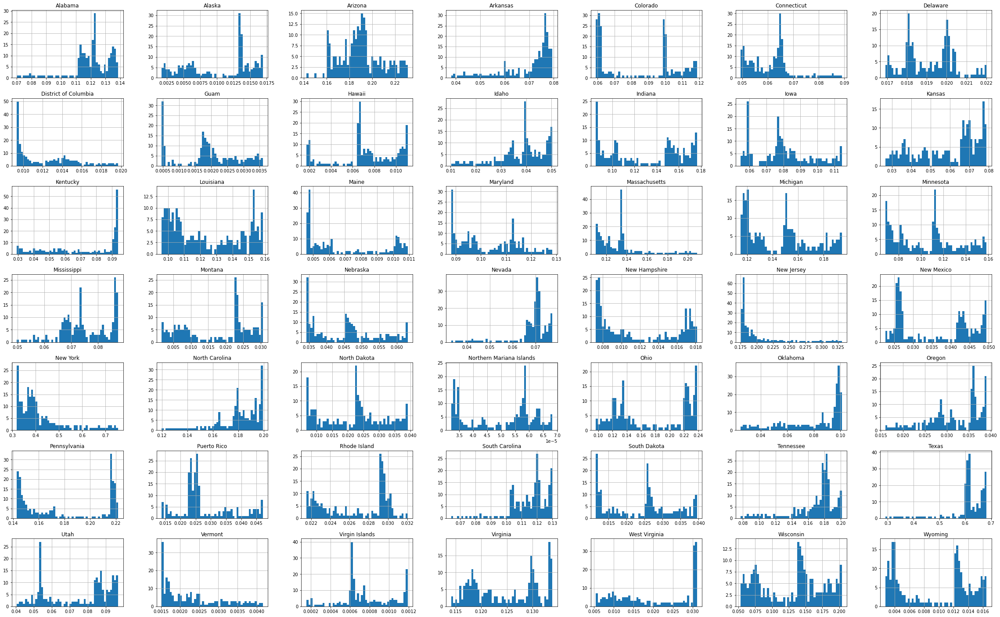

In [45]:
covid_confirmed_pd_dataset_tr.hist(bins=50, figsize=(40, 25))
print("United States confirmed COVID cases histograms broken down per state after Normalization")
plt.show()

## Selecting and Training our Model

We aim to perform a regression task on our data using a linear Regression model, polynomial regression model, decison tree regressor, Random forest regressor model and also Recurrent neural network regressor. We will then compute the model with the lowest cost function (i.e. the best model) and use it for all our predictions henceforth going forward for consistency purposes.

In order to do this successfully we will also need to split our training set data further into two in order to create a validation set. The cost function value of our model will be determined on our validation set. The split is done in a similar manner as the split of the training and testing set as shown below.

In [46]:
# train_set_confirmed_3, validation_set_confirmed = train_test_split(covid_confirmed_pd_dataset_tr, test_size = 0.2, random_state = 100)
# train_set_deaths_3, validation_set_deaths = train_test_split(covid_deaths_pd_dataset_tr, test_size = 0.2, random_state = 100)
# train_set_recovered_3, validation_set_recovered = train_test_split(covid_recovered_pd_dataset_tr, test_size = 0.2, random_state = 100)

In [47]:
# train_set_confirmed_3.describe()

In [48]:
# validation_set_confirmed.describe()

In addition, we will also employ the use of cross validation in order to better evaluate our models. By using sklearn's inbuilt cross_validarion_method, we nolonger need to split the training data to create a validation set as this is done automatically. (Hence the commmented section)

In [49]:
from sklearn.model_selection import cross_val_score

def prettify_scores(scores):
    print("Scores: " + str(scores))
    print("Mean: " + str(scores.mean()))
    print("Std: " + str(scores.std()))

### Linear Regression Model

In [50]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

lin_reg = LinearRegression()

# Without Cross Validation
lin_reg.fit(np.array(train_set_confirmed_2["Date"].dt
                     .date
                     .map(datetime.datetime.toordinal)).reshape(-1,1),
            train_set_confirmed_2[COLUMNS_NEW[1]])
print("RMSE minus cv: " + str (mean_squared_error(lin_reg.predict(np.array(train_set_confirmed_2["Date"].dt
                                                                           .date.map(datetime.datetime.toordinal))
                                                                  .reshape(-1,1)),
                                                  train_set_confirmed_2[COLUMNS_NEW[1]],
                                                  squared=False)))

# With Cross Validation
lin_scores = cross_val_score(lin_reg, 
                             np.array(
                                 train_set_confirmed_2["Date"].dt
                                 .date
                                 .map(datetime.datetime.toordinal)).reshape(-1,1),
                             train_set_confirmed_2[COLUMNS_NEW[1]], 
                             scoring="neg_mean_squared_error", cv=10)
lin_rmse_scores = np.sqrt(-lin_scores)
prettify_scores(lin_rmse_scores)

# Perform CV on all states and store the values
lin_rmse_data = pd.DataFrame(columns=["state", "lin_reg_mean_rmse", "lin_reg_std"])
lin_reg = LinearRegression()

for i in range(0, len(COLUMNS_NEW[1:])):
    lin_scores_data = cross_val_score(lin_reg,
                                 np.array(
                                     train_set_confirmed_2["Date"].dt
                                     .date
                                     .map(datetime.datetime.toordinal)).reshape(-1,1),
                                 train_set_confirmed_2[COLUMNS_NEW[1:][i]],
                                 scoring="neg_mean_squared_error", cv=10)
    lin_rmse_scores_data = np.sqrt(-lin_scores_data)
    lin_rmse_data = lin_rmse_data.append({"state":COLUMNS_NEW[1:][i], "lin_reg_mean_rmse":lin_rmse_scores_data.mean(), 
                          "lin_reg_std":lin_rmse_scores_data.std()}, ignore_index=True)

lin_rmse_data.head()

RMSE minus cv: 29606.79971517188
Scores: [27648.37518129 27440.99721544 29997.41069512 31559.75174153
 30418.36426139 33693.40996501 30186.8938516  25227.99365903
 27439.49975311 33591.31264709]
Mean: 29720.400897060044
Std: 2642.0953399485084


,state,lin_reg_mean_rmse,lin_reg_std
0,Alabama,29720.400897,2642.095340
1,Alaska,5543.889706,301.273141
2,Arizona,82972.655973,7401.678462
3,Arkansas,21836.750683,1691.901881
4,Colorado,42545.759379,2774.523420


### Polynomial Regression Model

In [51]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

poly = make_pipeline(PolynomialFeatures(5),LinearRegression())

# Without Cross Validation
poly.fit(np.array(train_set_confirmed_2["Date"].dt
                  .date
                  .map(datetime.datetime.toordinal)).reshape(-1,1),
         train_set_confirmed_2[COLUMNS_NEW[1]])
print("RMSE minus cv: " + str (mean_squared_error(poly.predict(np.array(train_set_confirmed_2["Date"].dt
                                                                        .date.map(datetime.datetime.toordinal))
                                                               .reshape(-1,1)),
                                                  train_set_confirmed_2[COLUMNS_NEW[1]],
                                                  squared=False)))

# With Cross Validation
poly_scores = cross_val_score(poly, 
                             np.array(
                                 train_set_confirmed_2["Date"].dt
                                 .date
                                 .map(datetime.datetime.toordinal)).reshape(-1,1),
                             train_set_confirmed_2[COLUMNS_NEW[5]], 
                             scoring="neg_mean_squared_error", cv=10)
poly_rsme_scores = np.sqrt(-poly_scores)
prettify_scores(poly_rsme_scores)

# Perform CV on all states and store the values
poly_rmse_data = pd.DataFrame(columns=["state", "poly_reg_mean_rmse", "poly_reg_std"])
poly = make_pipeline(PolynomialFeatures(5),LinearRegression())

for i in range(0, len(COLUMNS_NEW[1:])):
    poly_scores_data = cross_val_score(poly,
                                 np.array(
                                     train_set_confirmed_2["Date"].dt
                                     .date
                                     .map(datetime.datetime.toordinal)).reshape(-1,1),
                                 train_set_confirmed_2[COLUMNS_NEW[1:][i]],
                                 scoring="neg_mean_squared_error", cv=10)
    poly_rmse_scores_data = np.sqrt(-poly_scores_data)
    poly_rmse_data = poly_rmse_data.append({"state":COLUMNS_NEW[1:][i], 
                                           "poly_reg_mean_rmse":poly_rmse_scores_data.mean(), 
                                           "poly_reg_std":poly_rmse_scores_data.std()}, ignore_index=True)

poly_rmse_data.head()

RMSE minus cv: 22251.343692207385
Scores: [36073.95887533 32346.83801431 33817.54076898 33045.34479736
 33918.45816779 35817.25138465 36545.32162139 38324.10377718
 40227.5683355  27186.89632834]
Mean: 34730.328207083956
Std: 3410.7431932866225


,state,poly_reg_mean_rmse,poly_reg_std
0,Alabama,22575.392494,2885.501221
1,Alaska,4987.564257,507.131970
2,Arizona,53436.882283,6542.183670
3,Arkansas,15870.325831,2635.467980
4,Colorado,34730.328207,3410.743193


### Decison Tree Regressor Model

In [52]:
from sklearn.tree import DecisionTreeRegressor

tree_reg = DecisionTreeRegressor()

# Without Cross Validation
tree_reg.fit(np.array(train_set_confirmed_2["Date"].dt
                      .date
                      .map(datetime.datetime.toordinal)).reshape(-1,1),
             train_set_confirmed_2[COLUMNS_NEW[1]])
print("RMSE minus cv: " + str (mean_squared_error(tree_reg.predict(np.array(train_set_confirmed_2["Date"].dt
                                                                            .date.map(datetime.datetime.toordinal))
                                                                   .reshape(-1,1)),
                                                  train_set_confirmed_2[COLUMNS_NEW[1]],
                                                  squared=False)))

# With Cross Validation
tree_scores = cross_val_score(tree_reg, 
                             np.array(
                                 train_set_confirmed_2["Date"].dt
                                 .date
                                 .map(datetime.datetime.toordinal)).reshape(-1,1),
                             train_set_confirmed_2[COLUMNS_NEW[1]], 
                             scoring="neg_mean_squared_error", cv=10)
tree_rmse_scores = np.sqrt(-tree_scores)
prettify_scores(tree_rmse_scores)

# Perform CV on all states and store the values
tree_rmse_data = pd.DataFrame(columns=["state", "tree_reg_mean_rmse", "tree_reg_std"])
tree_reg = DecisionTreeRegressor()

for i in range(0, len(COLUMNS_NEW[1:])):
    tree_scores_data = cross_val_score(tree_reg,
                                       np.array(
                                           train_set_confirmed_2["Date"].dt
                                           .date
                                           .map(datetime.datetime.toordinal)).reshape(-1,1),
                                       train_set_confirmed_2[COLUMNS_NEW[1:][i]],
                                       scoring="neg_mean_squared_error", cv=10)
    tree_rmse_scores_data = np.sqrt(-tree_scores_data)
    tree_rmse_data = tree_rmse_data.append({"state":COLUMNS_NEW[1:][i], 
                                            "tree_reg_mean_rmse":tree_rmse_scores_data.mean(),
                                            "tree_reg_std":tree_rmse_scores_data.std()}, ignore_index=True)

tree_rmse_data.head()

RMSE minus cv: 0.0
Scores: [3086.98294386 1907.28414721 2240.92288213 2696.80333493 1451.45686999
 2773.64460757 2605.33608895 2649.16956113 2436.07153015 1464.28707444]
Mean: 2331.195904034123
Std: 529.2659790499905


,state,tree_reg_mean_rmse,tree_reg_std
0,Alabama,2331.195904,529.265979
1,Alaska,346.845570,86.628838
2,Arizona,4217.353706,1365.000975
3,Arkansas,1513.279086,384.394396
4,Colorado,2374.843781,698.116026


### Random Forest Regressor Model

In [53]:
from sklearn.ensemble import RandomForestRegressor

forest_reg = RandomForestRegressor()

# Without Cross Validation
forest_reg.fit(np.array(train_set_confirmed_2["Date"].dt
                        .date
                        .map(datetime.datetime.toordinal)).reshape(-1,1),
               train_set_confirmed_2[COLUMNS_NEW[1]])
print("RMSE minus cv: " + str (mean_squared_error(forest_reg.predict(np.array(train_set_confirmed_2["Date"].dt
                                                                              .date.map(datetime.datetime.toordinal))
                                                                     .reshape(-1,1)),
                                                  train_set_confirmed_2[COLUMNS_NEW[1]],
                                                  squared=False)))

# With Cross Validation
forest_scores = cross_val_score(forest_reg,
                                np.array(train_set_confirmed_2["Date"].dt
                                         .date
                                         .map(datetime.datetime.toordinal)).reshape(-1,1),
                                train_set_confirmed_2[COLUMNS_NEW[1]],
                                scoring="neg_mean_squared_error", cv=10)
forest_rmse_scores = np.sqrt(-forest_scores)
prettify_scores(forest_rmse_scores)

# Perform CV on all states and store the values
forest_rmse_data = pd.DataFrame(columns=["state", "forest_reg_mean_rmse", "forest_reg_std"])
forest_reg = RandomForestRegressor()

for i in range(0, len(COLUMNS_NEW[1:])):
    forest_scores_data = cross_val_score(forest_reg,
                                         np.array(train_set_confirmed_2["Date"].dt
                                                  .date
                                                  .map(datetime.datetime.toordinal)).reshape(-1,1),
                                         train_set_confirmed_2[COLUMNS_NEW[1:][i]],
                                         scoring="neg_mean_squared_error", cv=10)
    forest_rmse_scores_data = np.sqrt(-forest_scores_data)
    forest_rmse_data = forest_rmse_data.append({"state":COLUMNS_NEW[1:][i],
                                                "forest_reg_mean_rmse":forest_rmse_scores_data.mean(),
                                                "forest_reg_std":forest_rmse_scores_data.std()}, ignore_index=True)

forest_rmse_data.head()

RMSE minus cv: 570.0697113368772
Scores: [2439.9495364  1212.47971361 1391.25859318 1457.16855888  859.38206456
 1773.73924222 2048.73887466 1390.8999858  1674.53103562 1260.68240858]
Mean: 1550.8830013518123
Std: 428.95421005726905


,state,forest_reg_mean_rmse,forest_reg_std
0,Alabama,1535.771251,359.929243
1,Alaska,219.674960,58.319832
2,Arizona,2609.958082,1024.647676
3,Arkansas,942.818842,290.329013
4,Colorado,1431.723432,402.497768


## Model Analysis

From the various models, we realize that the best model is the Random Forest Regressor Model as it minimizes the Root Mean Squared Error, our cost function.

It was however interesting to note that the Random Forest Regressor model also outperformed all our other models when applied to different states in the United States.

We therefore decided to select **the Random Forest Regressor Model** as our machine learning model for our regression analysis task.

Below is a breif peek of what the combined model analysis table looked like.

In [54]:
print("Model Analysis")
model_analysis = pd.merge(lin_rmse_data, poly_rmse_data, on="state")
model_analysis = pd.merge(model_analysis, tree_rmse_data, on="state")
model_analysis = pd.merge(model_analysis, forest_rmse_data, on="state")
model_analysis.head(10)

Model Analysis


,state,lin_reg_mean_rmse,lin_reg_std,poly_reg_mean_rmse,poly_reg_std,tree_reg_mean_rmse,tree_reg_std,forest_reg_mean_rmse,forest_reg_std
0,Alabama,29720.400897,2642.095340,22575.392494,2885.501221,2331.195904,529.265979,1535.771251,359.929243
1,Alaska,5543.889706,301.273141,4987.564257,507.131970,346.845570,86.628838,219.674960,58.319832
2,Arizona,82972.655973,7401.678462,53436.882283,6542.183670,4217.353706,1365.000975,2609.958082,1024.647676
3,Arkansas,21836.750683,1691.901881,15870.325831,2635.467980,1513.279086,384.394396,942.818842,290.329013
4,Colorado,42545.759379,2774.523420,34730.328207,3410.743193,2374.843781,698.116026,1431.723432,402.497768
5,Connecticut,31395.623095,2570.213203,15981.222354,1895.840626,1854.837318,526.953574,1365.843415,304.433374
6,Delaware,8643.862551,797.899709,4472.421403,530.745408,445.700236,110.835047,289.138433,67.511445
7,District of Columbia,2939.667545,235.012795,1371.810574,157.560027,167.465166,41.331517,113.458914,27.878586
8,Guam,865.196686,75.681711,699.931284,64.277491,68.117756,36.753277,52.166077,28.985780
9,Hawaii,982.847653,125.203996,788.240764,74.866462,146.717223,21.470936,98.534114,22.262607


## Fine Tuning our Model

After selecting our model, **Random Forest Regressor**, we would love to fine tune it. This means adjusting the model's hyper parameters until we find a great combination. We can leverage sklearn's inbuilt functionality and use either **GridSearchCV** or **RandomizedSearchCV** to automatically find the perfect hyperparameters combination.

In our case, we opted to use RandomizedSearchCV so as not to restrict our hyperparameter search space and only setting the number of iterations our search should run for.

We implement this as shown below:

In [55]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform

forest_reg = RandomForestRegressor()

n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]

param_distributions = {'n_estimators': n_estimators,
                       'max_features': max_features,
                       'max_depth': max_depth,
                       'min_samples_split': min_samples_split,
                       'min_samples_leaf': min_samples_leaf,
                       'bootstrap': bootstrap}

randomized_search = RandomizedSearchCV(forest_reg, param_distributions, cv=10, 
                                       scoring="neg_mean_squared_error", return_train_score=True)
randomized_search.fit(np.array(train_set_confirmed_2["Date"].dt
                               .date
                               .map(datetime.datetime.toordinal)).reshape(-1,1),
                      train_set_confirmed_2[COLUMNS_NEW[1:][i]])
randomized_search.best_params_

{'n_estimators': 1200,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 30,
 'bootstrap': True}

## Testing our Model

In [56]:
forest_rmse_data = pd.DataFrame(columns=["state", "forest_reg_mean_rmse", "forest_reg_std"])
forest_rmse_test_data = pd.DataFrame(columns=["state", "forest_test_rmse"])

for i in range(0, len(COLUMNS_NEW[1:])):
    forest_reg = RandomForestRegressor(n_estimators = randomized_search.best_params_['n_estimators'],
                                   min_samples_split = randomized_search.best_params_['min_samples_split'],
                                   min_samples_leaf = randomized_search.best_params_['min_samples_leaf'],
                                   max_features = randomized_search.best_params_['max_features'],
                                   max_depth = randomized_search.best_params_['max_depth'],
                                   bootstrap = randomized_search.best_params_['bootstrap'])
    forest_reg.fit(np.array(train_set_confirmed_2["Date"].dt
                        .date
                        .map(datetime.datetime.toordinal)).reshape(-1,1),
                   train_set_confirmed_2[COLUMNS_NEW[1:][i]])
    forest_scores_data = cross_val_score(forest_reg,
                                         np.array(train_set_confirmed_2["Date"].dt
                                                  .date
                                                  .map(datetime.datetime.toordinal)).reshape(-1,1),
                                         train_set_confirmed_2[COLUMNS_NEW[1:][i]],
                                         scoring="neg_mean_squared_error", cv=10)
    forest_rmse_scores_data = np.sqrt(-forest_scores_data)
    forest_rmse_data = forest_rmse_data.append({"state":COLUMNS_NEW[1:][i],
                                                "forest_reg_mean_rmse":forest_rmse_scores_data.mean(),
                                                "forest_reg_std":forest_rmse_scores_data.std()}, ignore_index=True)
    test_rmse = mean_squared_error(forest_reg.predict(np.array(test_set_confirmed["Date"].dt
                                                               .date.map(datetime.datetime.toordinal))
                                                      .reshape(-1,1)),
                                   test_set_confirmed[COLUMNS_NEW[1]],
                                   squared=False)
    forest_rmse_test_data = forest_rmse_test_data.append({"state" : COLUMNS_NEW[1:][i],
                                                          "forest_test_rmse" : test_rmse}, ignore_index=True)
    

print(forest_rmse_data.head())
print(forest_rmse_test_data.head())
print("AVG TEST RMSE : " + str(np.mean(forest_rmse_test_data["forest_test_rmse"])))

      state  forest_reg_mean_rmse  forest_reg_std
0   Alabama           2206.681319      426.648692
1    Alaska            297.438867      105.251592
2   Arizona           3944.787733     1402.177894
3  Arkansas           1391.136351      331.229963
4  Colorado           2269.153570      756.390170
      state  forest_test_rmse
0   Alabama       1418.288021
1    Alaska     267577.381467
2   Arizona     176423.422862
3  Arkansas     112298.262599
4  Colorado      57666.559125
AVG TEST RMSE : 204418.19321823562


## Model Review

Our model performs much worse on the testing set with RSME scores averaging way higher than that of the training data. This goes to show yet again our data may be prone to overfitting. In addition, the fact that we are only using one predictor that is a timeseries may be a contributing factor.

For this next part, we aim to make adjustments in order to determine whether or not our model will improve and have better testing scores.

### Adding the State predictor variable.

In [57]:
def set_states(given_state):
    tracker = dict()
    for state in COLUMNS_NEW[1:]:
        if state != given_state:
            tracker[state] = 0
        else:
            tracker[state] = 1
    return tracker

NEW_COLUMNS = COLUMNS_NEW+["Confirmed", "Deaths", "Recovered"]
new_dataset = pd.DataFrame(columns = NEW_COLUMNS)
covid_confirmed_dataset.head()

for i in range(0, len(covid_confirmed_dataset)):
    for state in COLUMNS_NEW[1:]:
        datapoint = covid_confirmed_dataset.loc[i, :]
        confirmed_cases = datapoint[state]
        date = datapoint["Date"]
        tracker = set_states(state)
        tracker["Date"] = date
        tracker["Confirmed"] = confirmed_cases
        tracker["Deaths"] = covid_deaths_dataset.loc[i, :][state]
        tracker["Recovered"] = covid_recovered_dataset.loc[i, :][state]
        new_dataset = new_dataset.append(tracker, ignore_index=True)

                                         
for i in range(1, len(NEW_COLUMNS)):
    new_dataset[NEW_COLUMNS[i]] = new_dataset[NEW_COLUMNS[i]].astype('float').astype('int')

print(new_dataset.info())
new_dataset.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13573 entries, 0 to 13572
Data columns (total 53 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Date                      13573 non-null  datetime64[ns]
 1   Alabama                   13573 non-null  int64         
 2   Alaska                    13573 non-null  int64         
 3   Arizona                   13573 non-null  int64         
 4   Arkansas                  13573 non-null  int64         
 5   Colorado                  13573 non-null  int64         
 6   Connecticut               13573 non-null  int64         
 7   Delaware                  13573 non-null  int64         
 8   District of Columbia      13573 non-null  int64         
 9   Guam                      13573 non-null  int64         
 10  Hawaii                    13573 non-null  int64         
 11  Idaho                     13573 non-null  int64         
 12  Indiana           

,Date,Alabama,Alaska,Arizona,Arkansas,Colorado,Connecticut,Delaware,District of Columbia,Guam,...,Utah,Vermont,Virgin Islands,Virginia,West Virginia,Wisconsin,Wyoming,Confirmed,Deaths,Recovered
0,2020-06-28,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,36503,919,18866
1,2020-06-28,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,880,14,521
2,2020-06-28,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,73920,1594,8926
3,2020-06-28,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,19818,264,13270
4,2020-06-28,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,32307,1676,4442


Now that we have added the states as a categorical attribute predictor, we would love to split the data, train and test it and see if we have any improvements from our previous model.

In [58]:
new_dataset_train, new_dataset_test = train_test_split(new_dataset, test_size = 0.2, random_state = 100)
new_dataset_train["Date"] = np.ravel(new_dataset_train["Date"].dt.date.map(datetime.datetime.toordinal))
new_dataset_test["Date"] = np.ravel(new_dataset_test["Date"].dt.date.map(datetime.datetime.toordinal))

forest_reg = RandomForestRegressor()
forest_scores = cross_val_score(forest_reg,
                                new_dataset_train.loc[:, COLUMNS_NEW],
                                new_dataset_train.loc[:, ["Confirmed"]],
                                scoring="neg_mean_squared_error", cv=10)
forest_rmse_scores = np.sqrt(-forest_scores)
prettify_scores(forest_rmse_scores)

forest_reg.fit(new_dataset_train.loc[:, COLUMNS_NEW],
               new_dataset_train.loc[:, ["Confirmed"]])

test_rmse = mean_squared_error(forest_reg.predict(new_dataset_test.loc[:, COLUMNS_NEW]),
                               new_dataset_test.loc[:, ["Confirmed"]],
                               squared=False)
print("TEST RMSE: " + str(test_rmse))



<ipython-input-58-c6d3aff5f278>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_dataset_train["Date"] = np.ravel(new_dataset_train["Date"].dt.date.map(datetime.datetime.toordinal))
<ipython-input-58-c6d3aff5f278>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_dataset_test["Date"] = np.ravel(new_dataset_test["Date"].dt.date.map(datetime.datetime.toordinal))
/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed whe

Scores: [1882.89256168 2541.18090746 2393.9729262  1978.66643804 1920.71373255
 2355.88175237 2040.74003453 2302.61502521 2005.65035837 2352.18750748]
Mean: 2177.4501243887544
Std: 223.07329567799945


<ipython-input-58-c6d3aff5f278>:13: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  forest_reg.fit(new_dataset_train.loc[:, COLUMNS_NEW],


TEST RMSE: 2155.984762359376


As observed form the test RMSE we do realize that the new model performs way better than the previous one after the introduction of the state variable as a categorical feature.

We now aim to find the optimum parameters required for fine tuning our model.

In [59]:
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]

param_distributions = {'n_estimators': n_estimators,
                       'max_features': max_features,
                       'max_depth': max_depth,
                       'min_samples_split': min_samples_split,
                       'min_samples_leaf': min_samples_leaf,
                       'bootstrap': bootstrap}

randomized_search = RandomizedSearchCV(forest_reg, param_distributions, cv=10, 
                                       scoring="neg_mean_squared_error", return_train_score=True)
randomized_search.fit(new_dataset_train.loc[:, COLUMNS_NEW],
                      new_dataset_train.loc[:, ["Confirmed"]])
randomized_search.best_params_

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y wa

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y wa

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y wa

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:531: DataConversionWarning: A column-vector y wa

{'n_estimators': 400,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'sqrt',
 'max_depth': 50,
 'bootstrap': True}

## Packaging and Deploying our Model

In [60]:
def load_data(confirmed_dataset, deaths_dataset, recovered_dataset):
    start_date = "06-28-2020"
    dates = np.array(pd.date_range(start_date, pd.to_datetime('today')))
    try:
        for date in dates:
            temp_date = parse_date(str(date))
            confirmed_dataset, deaths_dataset, recovered_dataset = get_daily_data(
                temp_date, confirmed_dataset, deaths_dataset, recovered_dataset)
    except KeyError as e:
        pass
    return (confirmed_dataset, deaths_dataset, recovered_dataset)
    

def set_states(given_state):
    tracker = dict()
    for state in COLUMNS_NEW[1:]:
        if state != given_state:
            tracker[state] = 0
        else:
            tracker[state] = 1
    return tracker

def convert_to_required_dataset(new_dataset, confirmed_dataset, deaths_dataset, recovered_dataset):
    for i in range(0, len(confirmed_dataset)):
        for state in COLUMNS_NEW[1:]:
            datapoint = confirmed_dataset.loc[i, :]
            confirmed_cases = datapoint[state]
            date = datapoint["Date"]
            tracker = set_states(state)
            tracker["Date"] = date
            tracker["Confirmed"] = confirmed_cases
            tracker["Deaths"] = deaths_dataset.loc[i, :][state]
            tracker["Recovered"] = recovered_dataset.loc[i, :][state]
            new_dataset = new_dataset.append(tracker, ignore_index=True)

    for i in range(1, len(NEW_COLUMNS)):
        new_dataset[NEW_COLUMNS[i]] = new_dataset[NEW_COLUMNS[i]].astype('float').astype('int')
    
    return new_dataset
    
    
def clean_and_split_data(dataset):
    return train_test_split(dataset[i][:, NEW_COLUMNS], test_size = 0.2, random_state = 100)


def train_and_test_multiple_categories(hyperparameters, train_dataset, test_dataset):
    categories = ["Confirmed", "Deaths", "Recovered"]
    regressors = dict()
    for category in categories:
        forest_reg = RandomForestRegressor(n_estimators=hyperparameters['n_estimators'], 
                                           min_samples_split=hyperparameters['min_samples_split'],
                                           min_samples_leaf= hyperparameters['min_samples_leaf'],
                                           max_features = hyperparameters['max_features'],
                                           max_depth=hyperparameters['max_depth'],
                                           bootstrap=hyperparameters['bootstrap'])
        forest_scores = cross_val_score(forest_reg,
                                        train_dataset.loc[:, COLUMNS_NEW],
                                        train_dataset.loc[:, [category]],
                                        scoring="neg_mean_squared_error", cv=10)
        forest_rmse_scores = np.sqrt(-forest_scores)
        print(category + " -------------------------------- ")
        prettify_scores(forest_rmse_scores)

        forest_reg.fit(train_dataset.loc[:, COLUMNS_NEW],
                       train_dataset.loc[:, [category]])

        test_rmse = mean_squared_error(forest_reg.predict(test_dataset.loc[:, COLUMNS_NEW]),
                                       test_dataset.loc[:, [category]],
                                       squared=False)
        print(category + " TEST RMSE: " + str(test_rmse))
        regressors[category] = forest_reg
    return regressors


def main():
    COLUMNS = ['Date','Alabama','Alaska','American Samoa','Arizona','Arkansas', 'California', 'Colorado', 'Connecticut',
           'Delaware', 'Diamond Princess', 'District of Columbia', 'Florida', 'Georgia', 'Grand Princess', 'Guam',
           'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland',
           'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada',
           'New Hampshire', 'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota',
           'Northern Mariana Islands', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania', 'Puerto Rico', 'Rhode Island',
           'South Carolina', 'South Dakota', 'Tennessee', 'Texas', 'Utah', 'Vermont', 'Virgin Islands', 'Virginia',
           'Washington','West Virginia','Wisconsin','Wyoming']

    COLUMNS_NEW = ['Date','Alabama', 'Alaska', 'Arizona', 'Arkansas', 'Colorado', 'Connecticut', 'Delaware', 
                   'District of Columbia', 'Guam', 'Hawaii', 'Idaho', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 
                   'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi', 'Montana',
                   'Nebraska', 'Nevada', 'New Hampshire', 'New Jersey', 'New Mexico', 'New York', 'North Carolina', 
                   'North Dakota', 'Northern Mariana Islands', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania', 
                   'Puerto Rico', 'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 'Texas', 'Utah', 
                   'Vermont', 'Virgin Islands', 'Virginia', 'West Virginia', 'Wisconsin', 'Wyoming']

    NEW_COLUMNS = COLUMNS_NEW+["Confirmed", "Deaths", "Recovered"]

    hyperparameters = {'n_estimators': 1600,
                       'min_samples_split': 2,
                       'min_samples_leaf': 2,
                       'max_features': 'sqrt',
                       'max_depth': 90,
                       'bootstrap': True}

    confirmed_dataset = pd.DataFrame(columns=COLUMNS)
    deaths_dataset = pd.DataFrame(columns=COLUMNS)
    recovered_dataset = pd.DataFrame(columns=COLUMNS)

    new_dataset = pd.DataFrame(columns = NEW_COLUMNS)
    
    confirmed_dataset, deaths_dataset, recovered_dataset = load_data(confirmed_dataset, deaths_dataset, recovered_dataset)
    new_dataset = convert_to_required_dataset(new_dataset, confirmed_dataset, deaths_dataset, recovered_dataset)
    train, test = clean_and_split_data(new_dataset)
    regressors = train_and_test_multiple_categories(hyperparameters, train, test)
    return regressors

main()

KeyError: 52

Now that we have all our regressor models all trained and set up, all that is left is setting up a web applicataion with an endpoint that will make calls to our model and use the predict method to predict future cases.

## Conclusion

### Improvements 

Into the future, I would include the Recurrent Neural Network as an additional model and see how it performs while predicting. I have started on it below, and would proceed to see how a time-series output could give us information about future covid statistics given data from all previous dates.It would be implemented as follows:

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN

model = Sequential([
    SimpleRNN(10, input_shape=[131, 1])
])
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mean_squared_error'])
## Then fit the model before using it for predictions